In [1]:
import numpy as np
import pandas as pd

from PIL import Image, ImageOps
from skimage import io
import random

from astropy.io import fits
from astropy.visualization import make_lupton_rgb

import matplotlib.pyplot as plt
plt.style.use('dark_background')

In [2]:
def make_plot_all(objects):
    #print(title)
    for i in range(len(objects)):
        if(i%4 == 0):
            plt.figure(figsize=(12,8))
            for j in range(4):
                if(i+j > len(objects)-1): break
                plt.subplot(1,4,j+1)
                rgb = make_lupton_rgb(objects[i+j][2], objects[i+j][1], objects[i+j][0], Q=11., stretch=40.)
                plt.imshow(rgb, aspect='equal')
                plt.xticks([], [])
                plt.yticks([], []) 
            plt.show()

In [3]:
hdu_list = fits.open('Sim_complete/exp/36.fits')
idx = random.sample(range(len(hdu_list[1].data)), 300)
images_pos = hdu_list[1].data[idx,:] 

hdu_list = fits.open('Sim_complete/negative_redmagic.fits')
idx = random.sample(range(len(hdu_list[1].data)), 300)
images_neg1 = hdu_list[1].data[idx,:] 

hdu_list = fits.open('Sim_complete/negative_othergalaxies.fits')
idx = random.sample(range(len(hdu_list[1].data)), 300)
images_neg2 = hdu_list[1].data[idx,:] 

path = '/Users/jimenagonzalez/research/DSPL/Searching-double-lenses/vit_cnn/Y6_catalog_files/DES2359-6331.fits'
hdu_list = fits.open(path)
idx = random.sample(range(len(hdu_list[1].data)), 200)
int_arr = hdu_list[2].data    # change 2->3 for PSFs 
img_min = hdu_list[4].data    # change 4->6 for PSFs
img_scale = hdu_list[5].data  # change 5->7 for PSFs
search_images = int_arr / 65535 * img_scale[:,:,np.newaxis,np.newaxis] + img_min[:,:,np.newaxis,np.newaxis]
images_real = search_images[idx,:] 

Positives


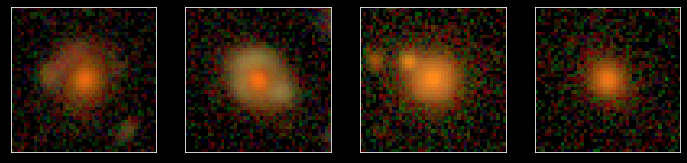

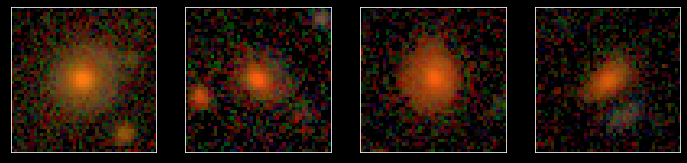

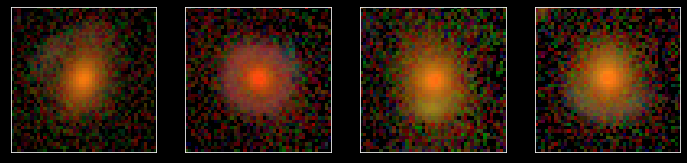

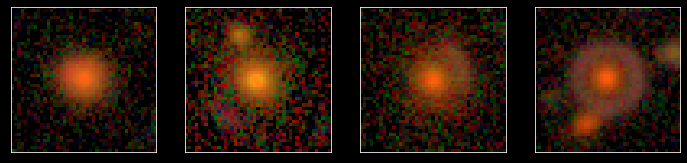

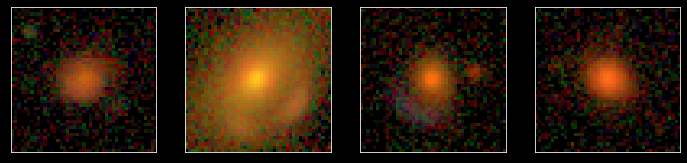

...

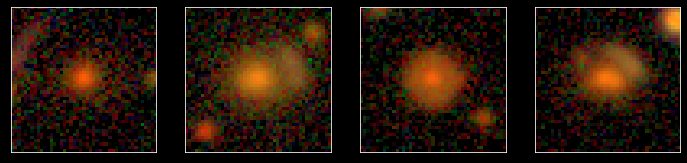

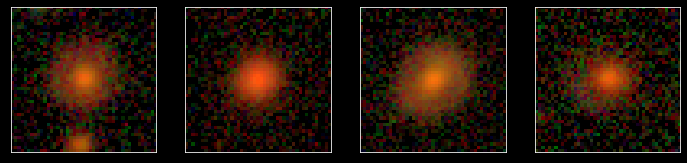

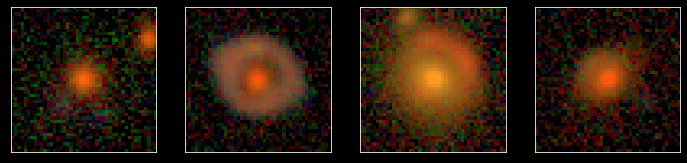

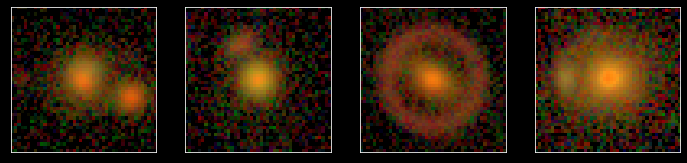

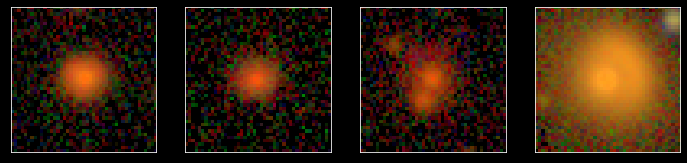

In [4]:
print('Positives')
make_plot_all(images_pos)

Negatives red magic


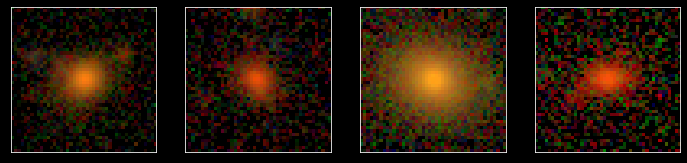

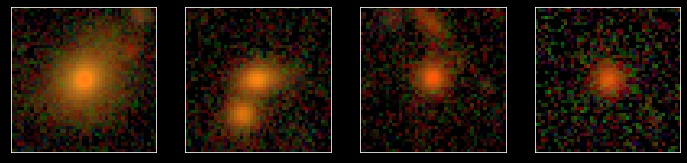

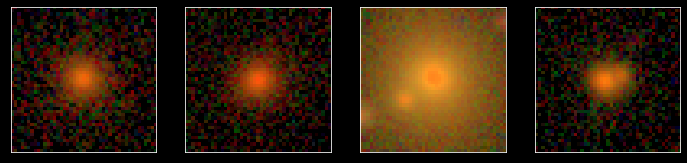

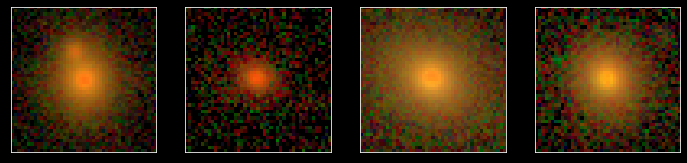

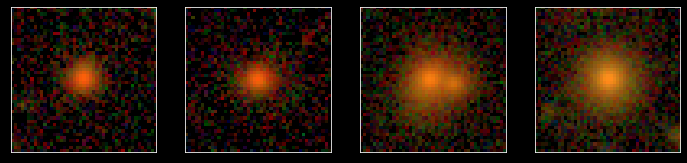

...

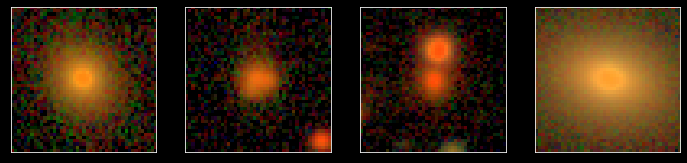

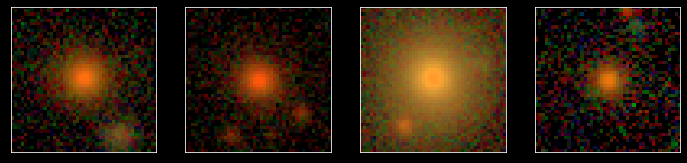

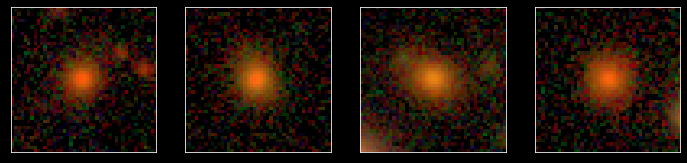

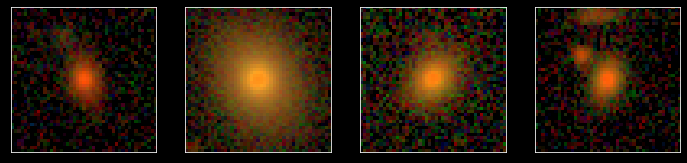

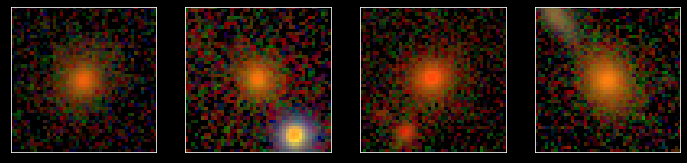

In [5]:
print('Negatives red magic')
make_plot_all(images_neg1)

Negatives other galaxies


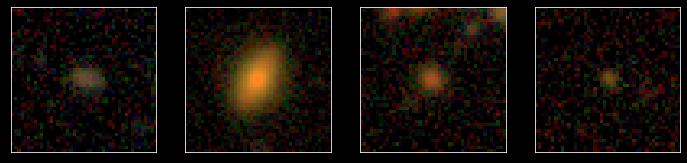

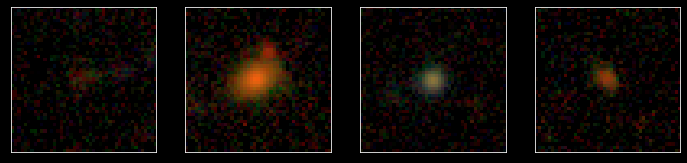

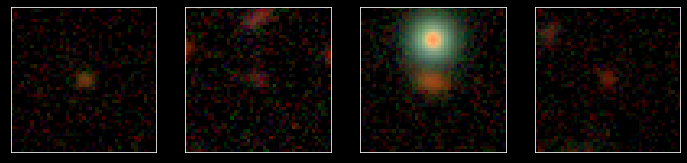

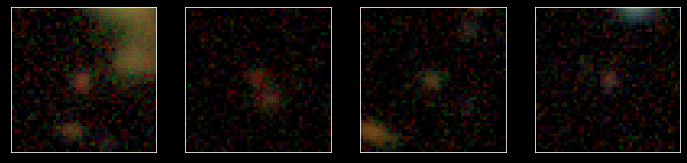

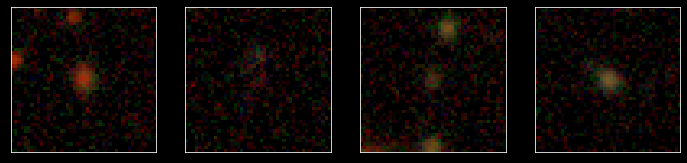

...

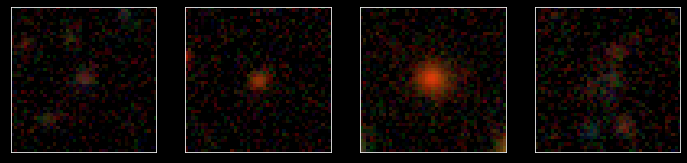

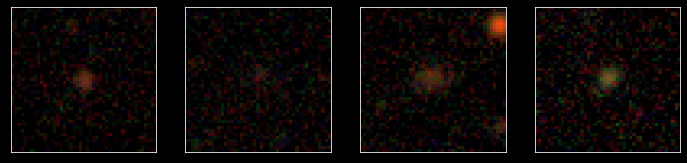

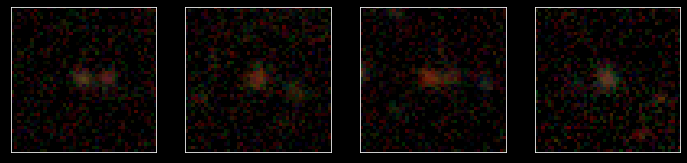

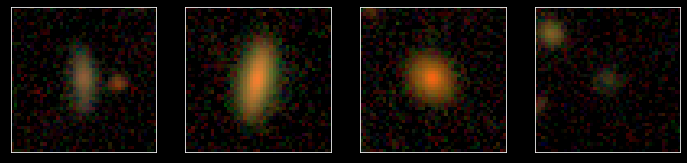

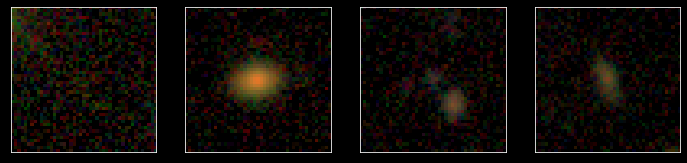

In [6]:
print('Negatives other galaxies')
make_plot_all(images_neg2)

Real


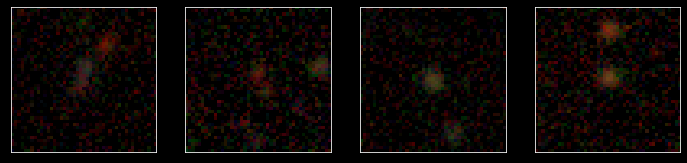

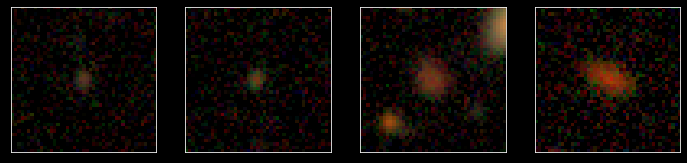

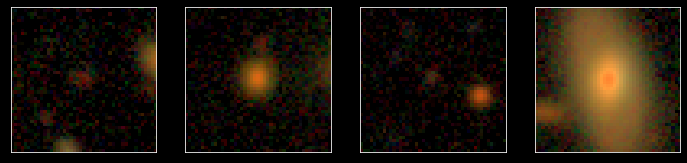

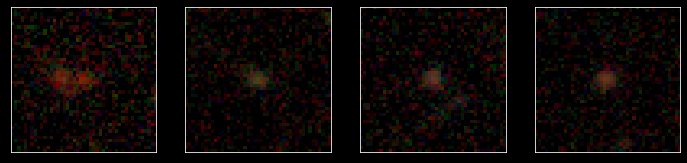

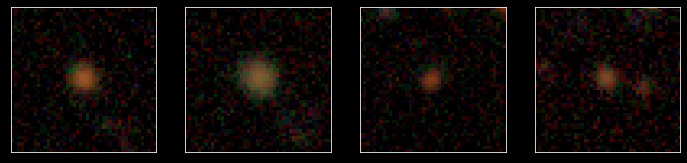

...

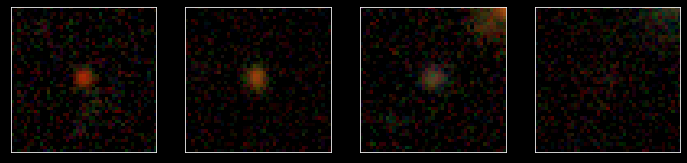

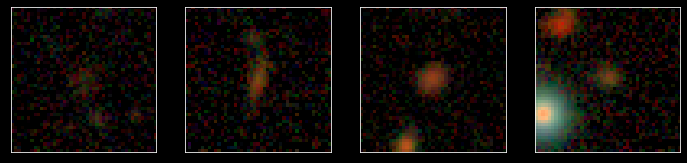

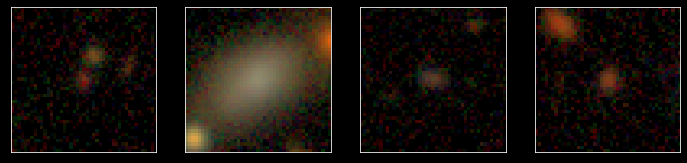

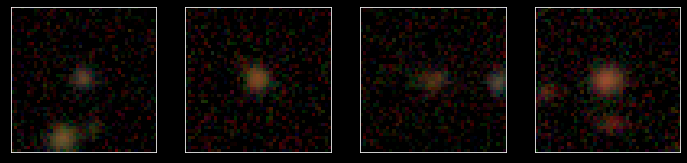

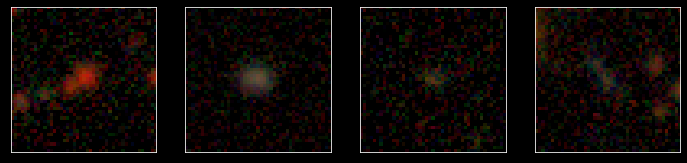

In [7]:
print('Real')
make_plot_all(images_real)